In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from glob import glob

In [23]:
# Define the path to the fits files
fits_dir = '/Users/masonjp2/Dropbox/suncet_dropbox/9000 Processing/data/synthetic/level0/fits/'

# Get all fits files in the directory
fits_files = glob(os.path.join(fits_dir, '*.fits'))
fits_files.sort()


# Extract just the filenames without paths
filenames = [os.path.basename(fits_file) for fits_file in fits_files]

# Define the number of bins for the histogram
num_bins = 16

# Define the range for the histogram (0 to 2^16)
hist_range = (0, 194400.0) # guess the images are in electrons instead of DN for some reaason
#hist_range = (0, 2**16)

# List to store all histograms and image data
histograms = []
images = []

# Process each fits file
for fits_file in fits_files:
    # Open the fits file
    with fits.open(fits_file) as hdul:
        # Get the image data
        image_data = hdul[0].data
        
        # Store the image data for later use in making a movie
        images.append(image_data.copy())
        
        # Compute the histogram
        hist, bin_edges = np.histogram(image_data, bins=num_bins, range=hist_range)
        
        # Store the histogram
        histograms.append(hist)
        
        # Print some information about the file and histogram
        print(f"File: {os.path.basename(fits_file)}")
        print(f"Image shape: {image_data.shape}")
        print(f"Min value: {np.min(image_data)}")
        print(f"Max value: {np.max(image_data)}")
        print(f"Histogram: {hist}")
        print("-" * 50)


File: config_default_OBS_2023-02-14T17:00:00.000_000.fits
Image shape: (750, 1000)
Min value: -11.445473728719486
Max value: 194400.0
Histogram: [ 17198 389817 179990  59876  27369  15341   9909   6902   5159   4085
   3103   2531   2206   1830   1649  23034]
--------------------------------------------------
File: config_default_OBS_2023-02-14T17:00:00.000_003.fits
Image shape: (750, 1000)
Min value: 249.33339727181618
Max value: 194400.0
Histogram: [ 15644  16056  12551   4603   2581  32881  93109  97687  84792  74802
  56497  42860  32865  25720  20612 136740]
--------------------------------------------------
File: config_default_OBS_2023-02-14T17:00:00.000_006.fits
Image shape: (750, 1000)
Min value: 201.27311136627245
Max value: 194400.0
Histogram: [ 15777  16212  12494   4535  25396 105119 112091  96928  77928  55170
  40434  30138  23300  18226  14558 101694]
--------------------------------------------------
File: config_default_OBS_2023-02-14T17:00:00.000_009.fits
Image shape

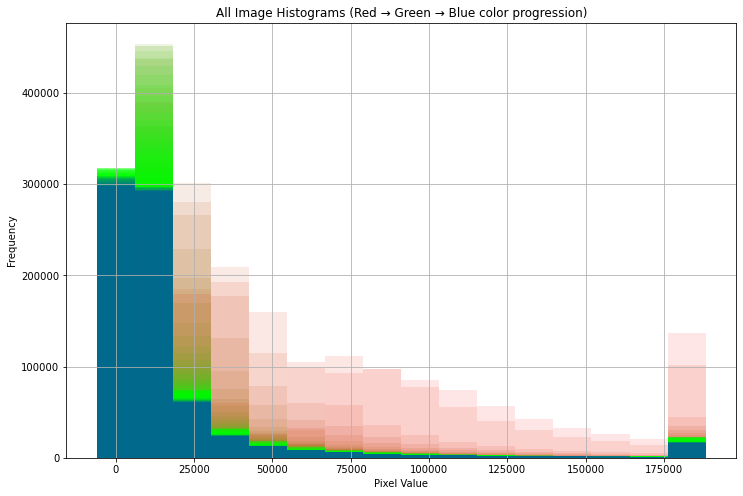

Total number of histograms: 120


In [29]:
# Plot all histograms as a bar chart with color gradient
plt.figure(figsize=(12, 8))

# Create a custom color map that transitions from red to green to blue
num_histograms = len(histograms)
colors = []

# Define transition points
red_to_green_start = 0
red_to_green_end = 20
green_to_blue_start = 100
green_to_blue_end = num_histograms

for i in range(num_histograms):
    if i < red_to_green_start:
        # Pure red for early frames
        colors.append([1, 0, 0])
    elif i < red_to_green_end:
        # Transition from red to green (frames 0-20)
        ratio = (i - red_to_green_start) / (red_to_green_end - red_to_green_start)
        colors.append([1-ratio, ratio, 0])
    elif i < green_to_blue_start:
        # Pure green for middle frames (frames 20-100)
        colors.append([0, 1, 0])
    elif i < green_to_blue_end:
        # Transition from green to blue (frames 100+)
        ratio = (i - green_to_blue_start) / (green_to_blue_end - green_to_blue_start)
        colors.append([0, 1-ratio, ratio])
    else:
        # Pure blue for late frames
        colors.append([0, 0, 1])

# Plot all histograms with low opacity
for i in range(len(histograms)):
    plt.bar(bin_edges[:-1], histograms[i], width=(hist_range[1]-hist_range[0])/num_bins, 
            color=colors[i], alpha=0.1, label=f'File {i+1}' if i < 5 else None)

plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.title('All Image Histograms (Red → Green → Blue color progression)')
plt.grid(True)
plt.show()

print(f"Total number of histograms: {len(histograms)}")

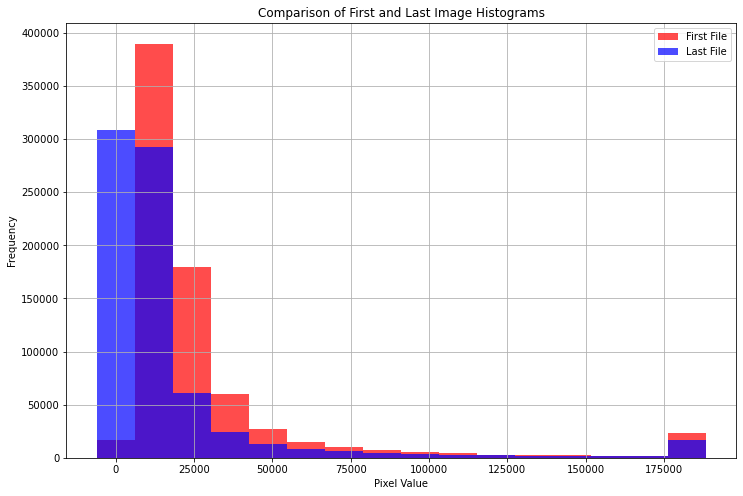

In [25]:
# Plot just the first and last histogram for comparison
plt.figure(figsize=(12, 8))

# Use the same color scheme as above (red for first, blue for last)
plt.bar(bin_edges[:-1], histograms[0], width=(hist_range[1]-hist_range[0])/num_bins, 
        color='red', alpha=0.7, label='First File')
plt.bar(bin_edges[:-1], histograms[-1], width=(hist_range[1]-hist_range[0])/num_bins, 
        color='blue', alpha=0.7, label='Last File')

plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.title('Comparison of First and Last Image Histograms')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


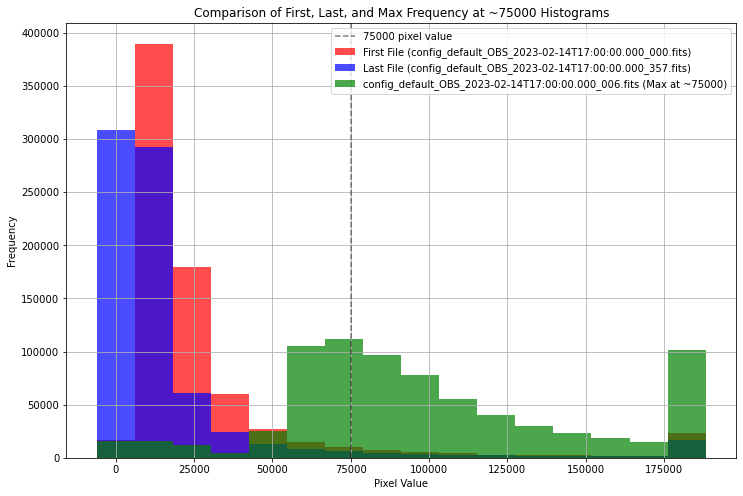

File with maximum frequency at ~75000 pixel value: config_default_OBS_2023-02-14T17:00:00.000_006.fits
Maximum frequency value at this bin: 112091


In [27]:
# Find the histogram with the largest frequency at around 75000 pixel value
target_bin_index = np.searchsorted(bin_edges, 75000) - 1
if target_bin_index >= len(bin_edges) - 1:
    target_bin_index = len(bin_edges) - 2  # Ensure we're within bounds

# Get the frequencies at this bin for all histograms
frequencies_at_target = [hist[target_bin_index] for hist in histograms]
max_freq_index = np.argmax(frequencies_at_target)

# Plot the first, last, and the histogram with max frequency at ~75000
plt.figure(figsize=(12, 8))

# First histogram in red
plt.bar(bin_edges[:-1], histograms[0], width=(hist_range[1]-hist_range[0])/num_bins, 
        color='red', alpha=0.7, label=f'First File ({filenames[0]})')

# Last histogram in blue
plt.bar(bin_edges[:-1], histograms[-1], width=(hist_range[1]-hist_range[0])/num_bins, 
        color='blue', alpha=0.7, label=f'Last File ({filenames[-1]})')

# Histogram with max frequency at ~75000 in green
plt.bar(bin_edges[:-1], histograms[max_freq_index], width=(hist_range[1]-hist_range[0])/num_bins, 
        color='green', alpha=0.7, label=f'{filenames[max_freq_index]} (Max at ~75000)')

# Add a vertical line at 75000 for reference
plt.axvline(x=75000, color='black', linestyle='--', alpha=0.5, label='75000 pixel value')

plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.title('Comparison of First, Last, and Max Frequency at ~75000 Histograms')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

print(f"File with maximum frequency at ~75000 pixel value: {filenames[max_freq_index]}")
print(f"Maximum frequency value at this bin: {frequencies_at_target[max_freq_index]}")


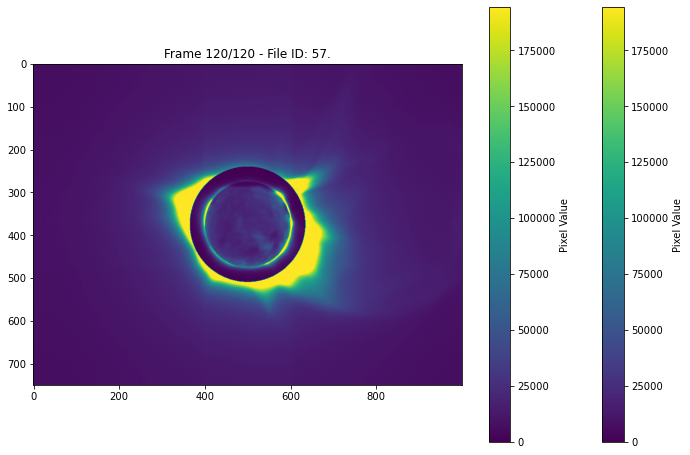

In [21]:
# Create a movie of the images with filename labels
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation
import os
from IPython.display import HTML

# Function to extract the last 3 digits from filename
def get_last_3_digits(filename):
    # Extract the base filename without path and extension
    base = os.path.basename(filename)
    # Get the last 3 digits before the extension
    last_3 = base[-7:-4]  # Assuming format like 'something_123.fits'
    return last_3

# Create a figure for the animation
fig, ax = plt.subplots(figsize=(12, 8))

# Function to update the frame
def update(frame_num):
    ax.clear()
    # Display the image
    im = ax.imshow(images[frame_num], cmap='viridis')
    
    # Add the last 3 digits of the filename as a label
    last_3_digits = get_last_3_digits(filenames[frame_num])
    ax.set_title(f'Frame {frame_num+1}/{len(images)} - File ID: {last_3_digits}')
    
    # Add colorbar if it's the first frame
    if frame_num == 0:
        fig.colorbar(im, ax=ax, label='Pixel Value')
    
    return [im]

# Create the animation
ani = FuncAnimation(fig, update, frames=len(images), 
                    interval=500,  # 500ms = 2 frames per second
                    blit=False)

# Display the animation in the notebook
HTML(ani.to_jshtml())


Maximum pixel value across all images: 194400.0
Image 1 (ID: 00.) - Max value: 194400.0
Image 2 (ID: 03.) - Max value: 194400.0
Image 3 (ID: 06.) - Max value: 194400.0
Image 4 (ID: 09.) - Max value: 194400.0
Image 5 (ID: 12.) - Max value: 194400.0
Image 6 (ID: 15.) - Max value: 194400.0
Image 7 (ID: 18.) - Max value: 194400.0
Image 8 (ID: 21.) - Max value: 194400.0
Image 9 (ID: 24.) - Max value: 194400.0
Image 10 (ID: 27.) - Max value: 194400.0
Image 11 (ID: 30.) - Max value: 194400.0
Image 12 (ID: 33.) - Max value: 194400.0
Image 13 (ID: 36.) - Max value: 194400.0
Image 14 (ID: 39.) - Max value: 194400.0
Image 15 (ID: 42.) - Max value: 194400.0
Image 16 (ID: 45.) - Max value: 194400.0
Image 17 (ID: 48.) - Max value: 194400.0
Image 18 (ID: 51.) - Max value: 194400.0
Image 19 (ID: 54.) - Max value: 194400.0
Image 20 (ID: 57.) - Max value: 194400.0
Image 21 (ID: 60.) - Max value: 194400.0
Image 22 (ID: 63.) - Max value: 194400.0
Image 23 (ID: 66.) - Max value: 194400.0
Image 24 (ID: 69.)

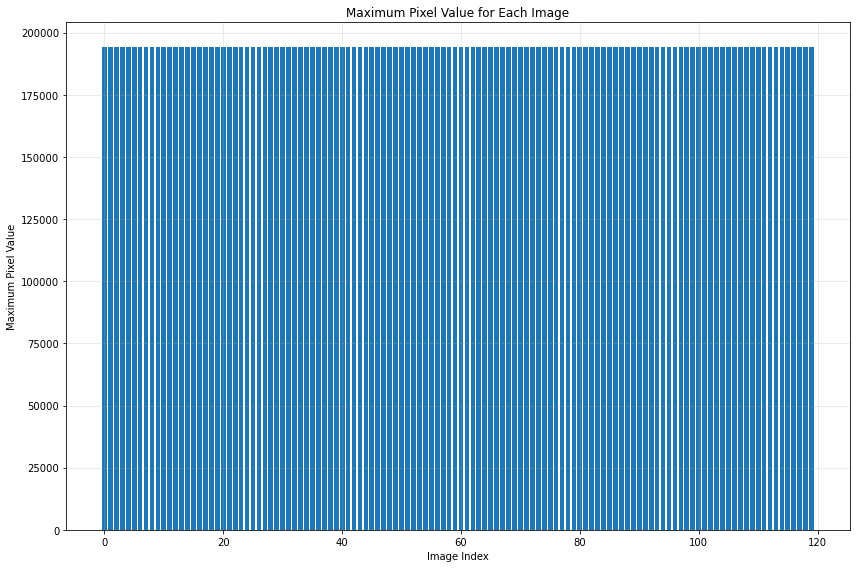

In [22]:
# Find the maximum pixel value across all images
max_value = max([np.max(img) for img in images])
print(f"Maximum pixel value across all images: {max_value}")

# Let's also see the max value for each individual image
for i, img in enumerate(images):
    img_max = np.max(img)
    last_3_digits = get_last_3_digits(filenames[i])
    print(f"Image {i+1} (ID: {last_3_digits}) - Max value: {img_max}")

# Visualize the distribution of maximum values
plt.figure(figsize=(12, 8))
max_values = [np.max(img) for img in images]
plt.bar(range(len(max_values)), max_values)
plt.xlabel('Image Index')
plt.ylabel('Maximum Pixel Value')
plt.title('Maximum Pixel Value for Each Image')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()
